In [1]:
import scipy.io
import numpy as np
import os
import scipy.misc
import matplotlib.pyplot as plt
from functools import reduce
from operator import mul
import tensorflow as tf
%matplotlib inline

C:\Users\StrikeWade\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


# Useful function

In [2]:
def conv_layer(input, weights, biases):
    conv = tf.nn.conv2d(input, filter=tf.constant(weights), strides=[1,1,1,1], padding='SAME')
    return tf.nn.bias_add(conv, biases)

def pool_layer(input):
    return tf.nn.max_pool(input, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')

def preprocess(image, mean_pixel):
    return image - mean_pixel

def unprocess(image, mean_pixel):
    return image + mean_pixel

def imread(path):
    return scipy.misc.imread(path).astype(tf.float32)

def imsave(path, image):
    image = np.clip(image, 0, 255).astype(tf.uint8)
    scipy.misc.imsave(path, image)

# Define VGG net

In [3]:
def vgg_net(data_path, input_image):
    layers = (
        'conv1_1', 'relu1_1', 'conv1_2', 'relu1_2', 'pool1',
        'conv2_1', 'relu2_1', 'conv2_2', 'relu2_2', 'pool2',
        'conv3_1', 'relu3_1', 'conv3_2', 'relu3_2', 'conv3_3',
        'relu3_3', 'conv3_4', 'relu3_4', 'pool3',
        'conv4_1', 'relu4_1', 'conv4_2', 'relu4_2', 'conv4_3',
        'relu4_3', 'conv4_4', 'relu4_4', 'pool4',
        'conv5_1', 'relu5_1', 'conv5_2', 'relu5_2', 'conv5_3',
        'relu5_3', 'conv5_4', 'relu5_4'
    )
    
    data = scipy.io.loadmat(data_path)
    mean = data['normalization'][0][0][0]
    mean_pixel = np.mean(a=mean, axis=(0,1))
    weights = data['layers'][0]
    net = {}
    current_image = input_image
    
    for i, name in enumerate(layers):
        kind = name[:4]
        
        if kind == 'conv':
            kernels, bias = weights[i][0][0][0][0]
            # matconvnet: weights are [width, height, in_channels, out_channels]
            # tensorflow: weights are [height, width, in_channels, out_channels]
            kernels = np.transpose(a=kernels, axes=(1, 0, 2, 3))
            bias = bias.reshape(-1)
            current_image = conv_layer(current_image, kernels, bias)
        
        elif kind == 'relu':
            current_image = tf.nn.relu(current_image)
            
        elif kind == 'pool':
            current_image = pool_layer(current_image)
            
        net[name] = current_image
    assert len(net) == len(layers)
    return net, mean_pixel, layers

# Extract features of a content image

C:\Users\StrikeWade\Anaconda3\lib\site-packages\ipykernel\__main__.py:5: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.


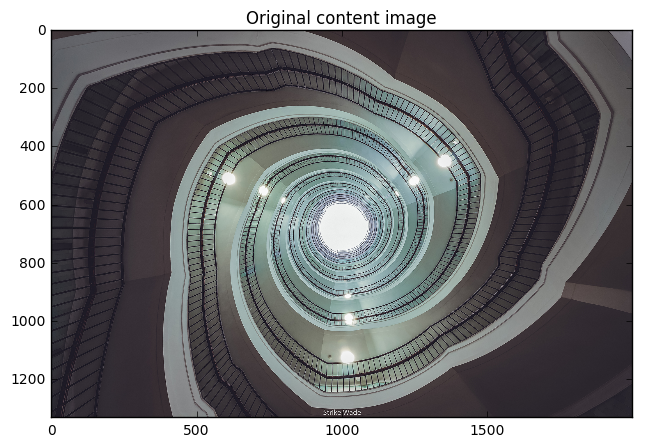

Type of features is:  <class 'numpy.ndarray'>
Shape of features is:  (1, 667, 1000, 128)


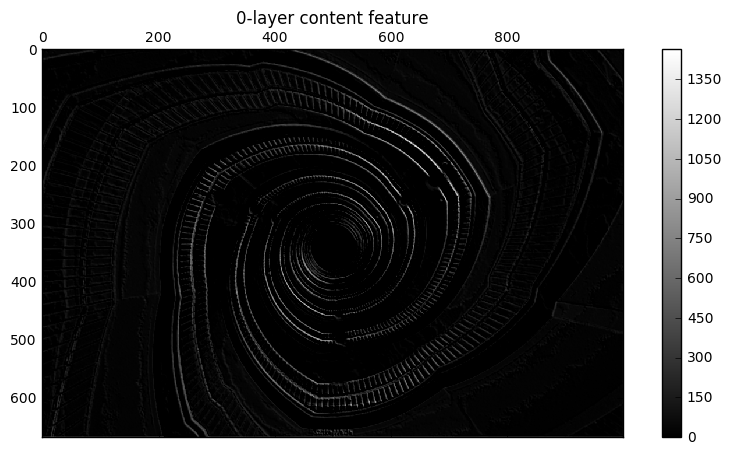

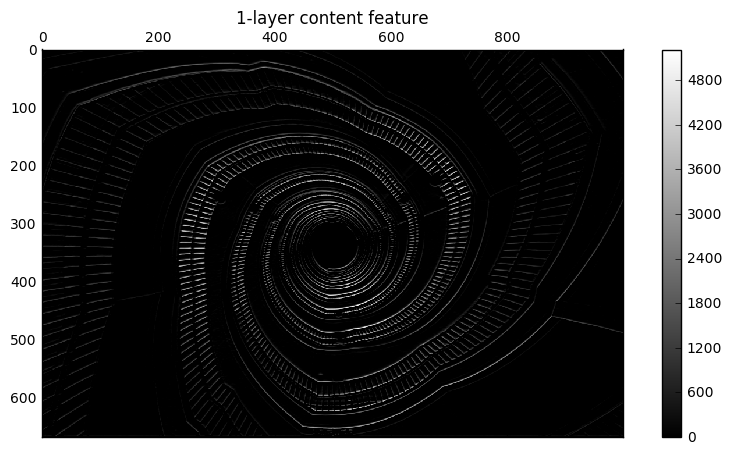

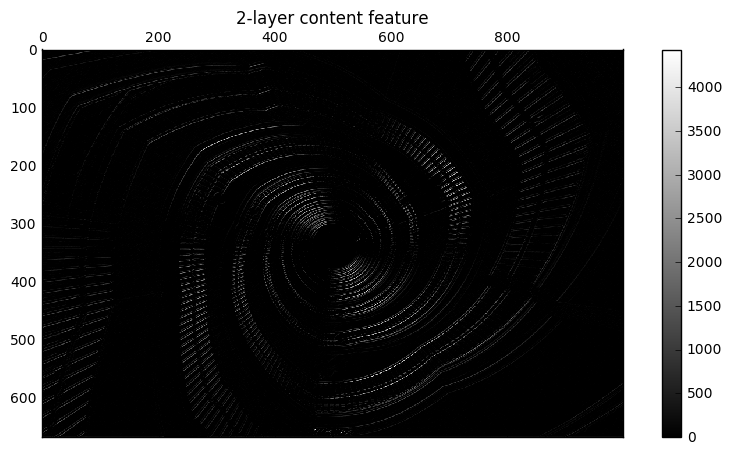

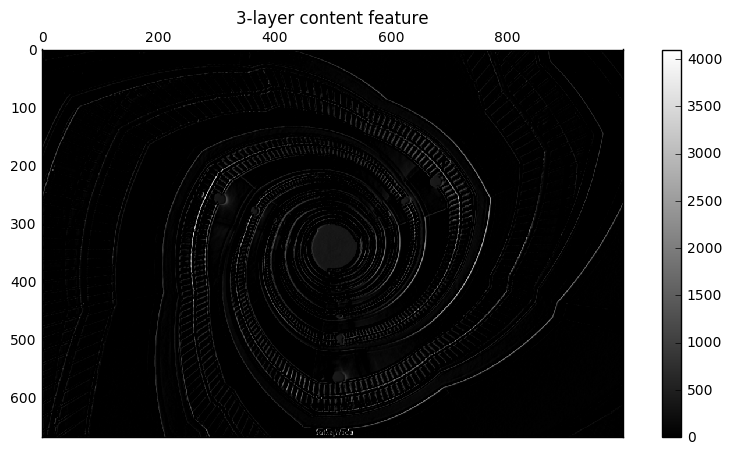

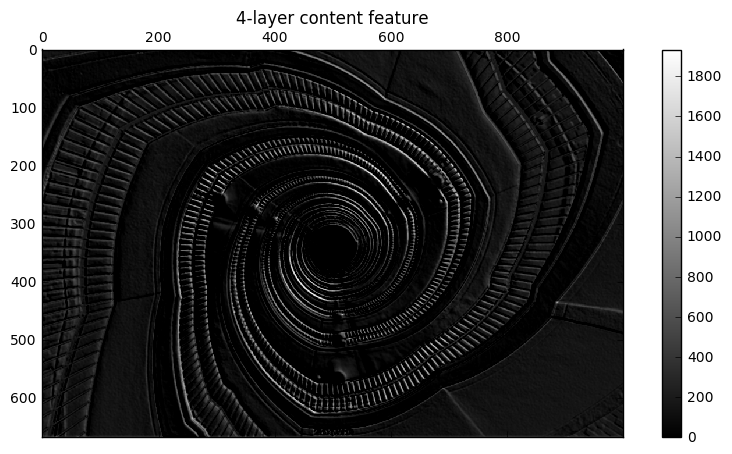

In [4]:
VGG_PATH = '../VGG pre-trained model/pre-trained-model/imagenet-vgg-verydeep-19.mat'
CONTENT_PATH = 'content_images/content.jpg'
CONTENT_LAYER = 'relu2_2'

raw_content = scipy.misc.imread(CONTENT_PATH)
plt.figure(0, figsize=(10,5))
plt.imshow(raw_content)
plt.title('Original content image')
plt.show()

content_image = raw_content.astype(np.float32)
content_shape = (1,) + content_image.shape    # (h,w,c) -> (1,h,w,c)

with tf.Graph().as_default(), tf.Session() as sess, tf.device('/gpu:0'):
    image = tf.placeholder(dtype=tf.float32, shape=content_shape)
    nets, content_mean_pixel, _ = vgg_net(VGG_PATH, image)
    content_image_pre = np.array([preprocess(content_image, content_mean_pixel)])
    
    content_features = nets[CONTENT_LAYER].eval(feed_dict={image: content_image_pre})
    
    print('Type of features is: ', type(content_features))
    print('Shape of features is: ', content_features.shape)
    
    #Plot response
    for i in range(5):
        plt.figure(i, figsize=(10, 5))
        plt.matshow(content_features[0,:,:,i], cmap=plt.cm.gray, fignum=i)
        plt.title('%d-layer content feature' % i)
        plt.colorbar()
        plt.show()

# Extract features of a style image

C:\Users\StrikeWade\Anaconda3\lib\site-packages\ipykernel\__main__.py:4: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.


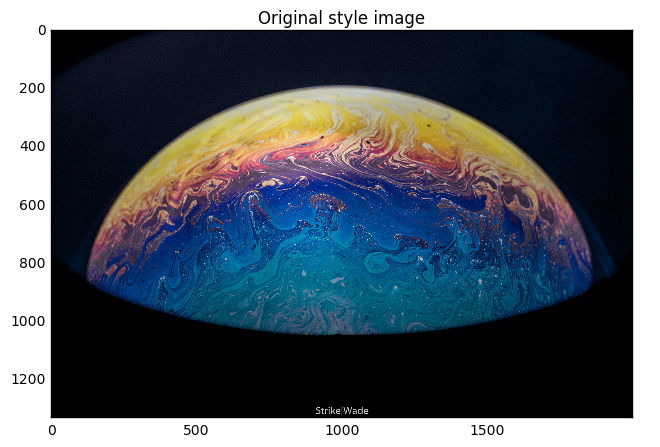

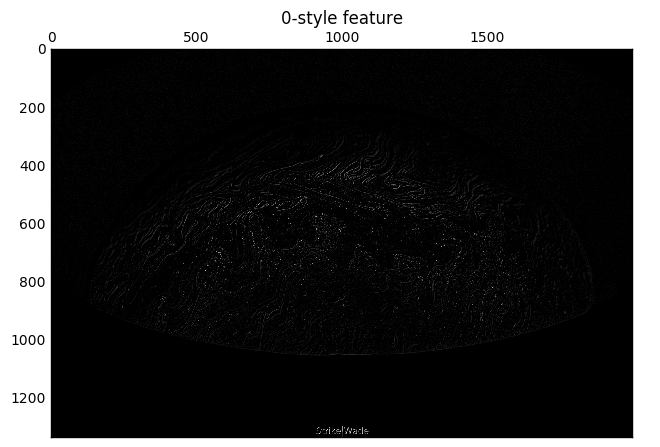

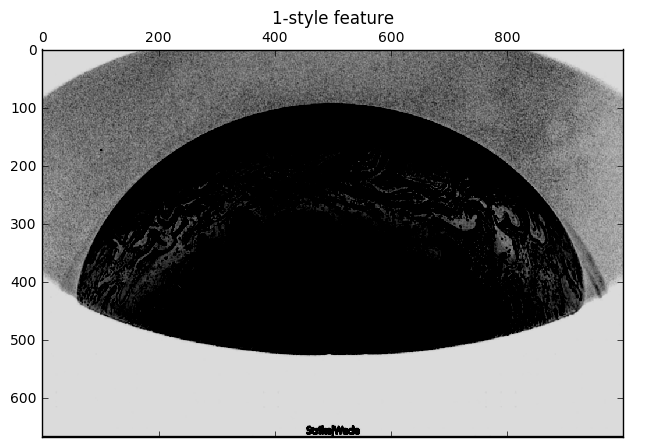

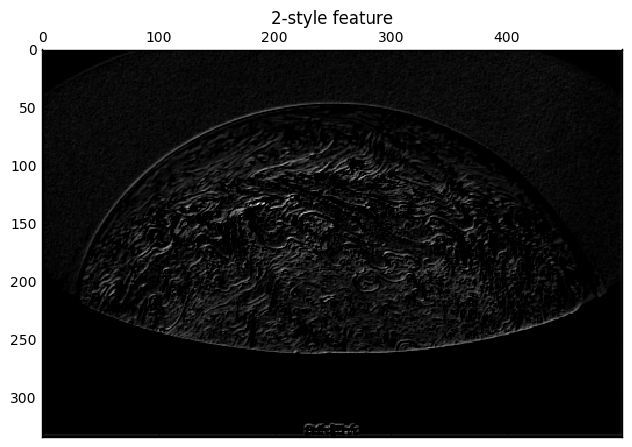

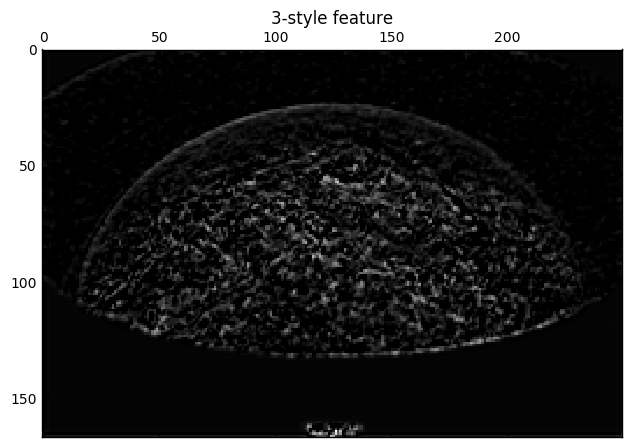

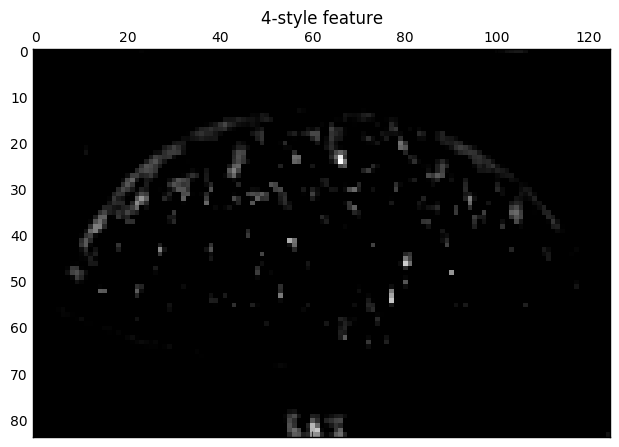

In [5]:
STYLE_PATH = 'style_images/style.jpg'
STYLE_LAYERS = ('relu1_1', 'relu2_1', 'relu3_1', 'relu4_1','relu5_1')

raw_style = scipy.misc.imread(STYLE_PATH)
plt.figure(0, figsize=(10,5))
plt.imshow(raw_style)
plt.title('Original style image')
plt.show()

style_image = raw_style.astype(np.float32)
style_shape = (1,) + style_image.shape    # (h,w,c) -> (1,h,w,c)
style_features = dict()

with tf.Graph().as_default(), tf.Session() as sess, tf.device('/gpu:0'):
    image = tf.placeholder(dtype=tf.float32, shape=style_shape)
    nets, _, _ = vgg_net(VGG_PATH, image)
    style_image_pre = np.array([preprocess(style_image, content_mean_pixel)])
    
    for idx, layer in enumerate(STYLE_LAYERS):
        current_features = nets[layer].eval(feed_dict={image: style_image_pre})
        current_features_vec = np.reshape(current_features, newshape=[-1, current_features.shape[3]])
        gram = np.matmul(current_features_vec.T, current_features_vec) / current_features_vec.size
        style_features.update({layer: gram})
        
        #Plot response
        plt.figure(idx, figsize=(10,5))
        plt.matshow(current_features[0,:,:,0], cmap=plt.cm.gray, fignum=idx)
        plt.title('%d-style feature' % idx)
        plt.show()

# Optimize

Instructions for updating:
Use `tf.global_variables_initializer` instead.
[0/500]


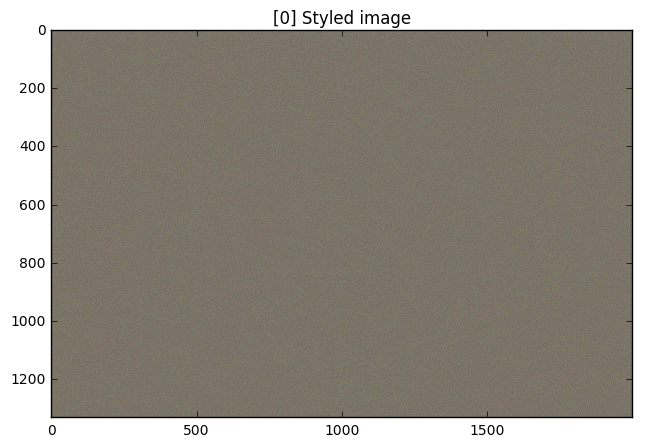

[50/500]


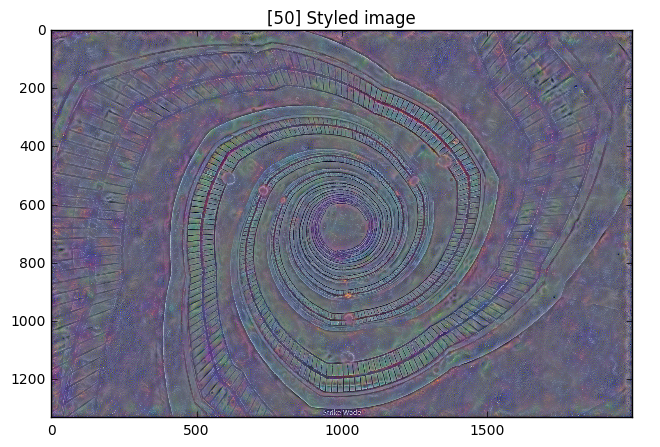

[100/500]


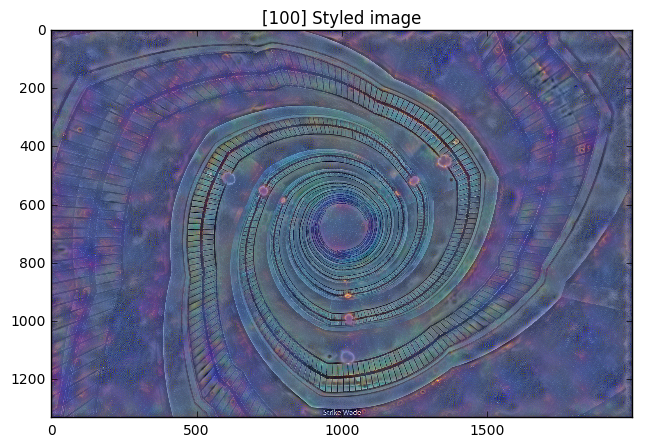

[150/500]


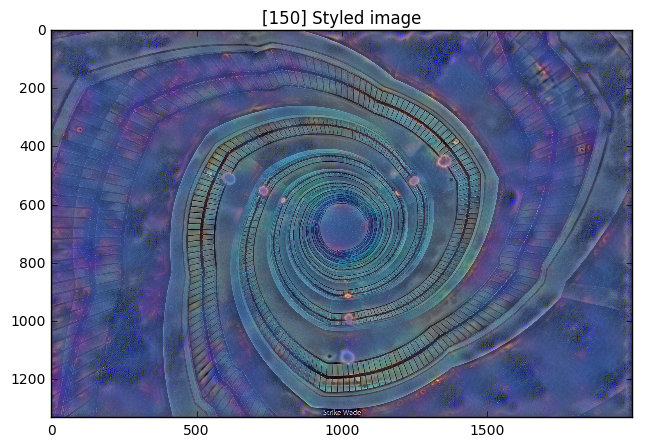

[200/500]


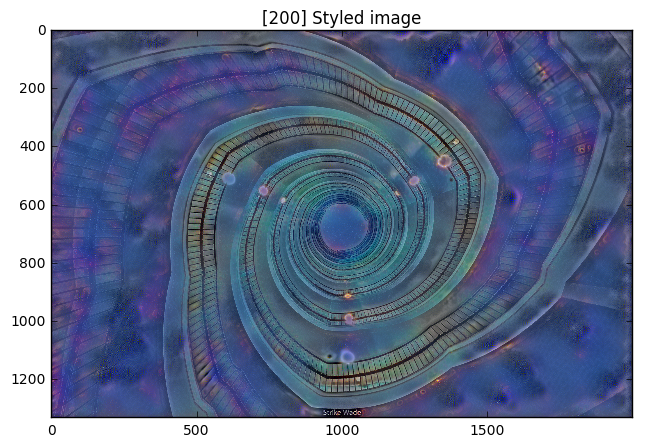

[250/500]


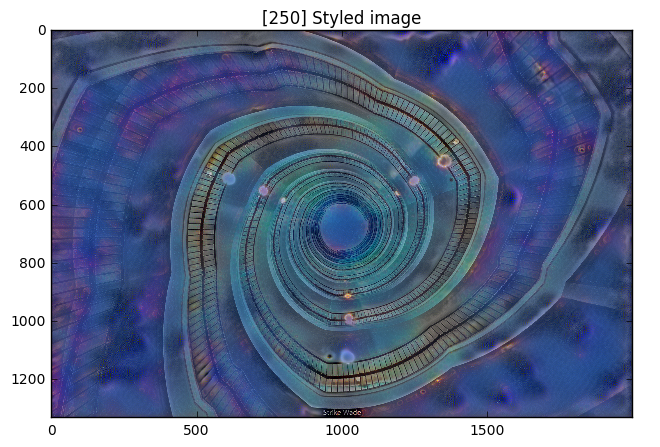

[300/500]


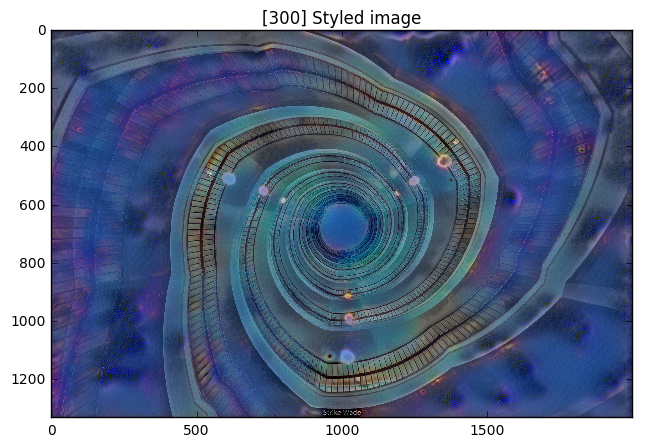

[350/500]


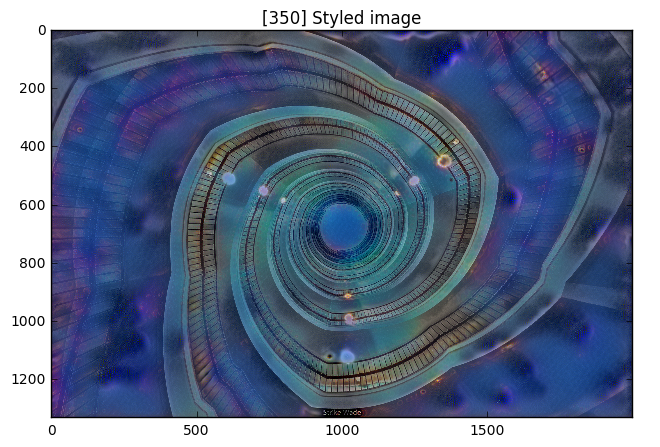

[400/500]


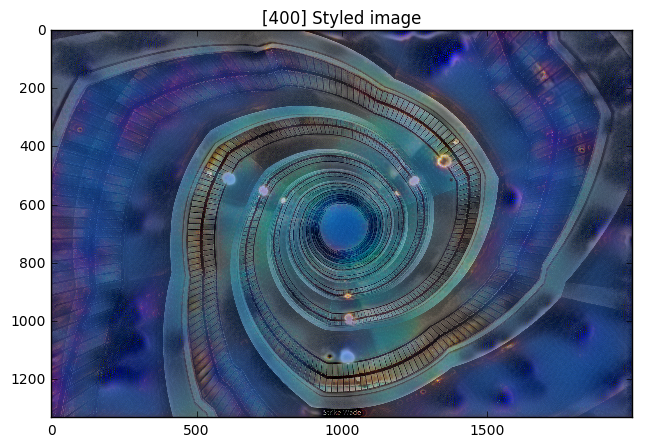

[450/500]


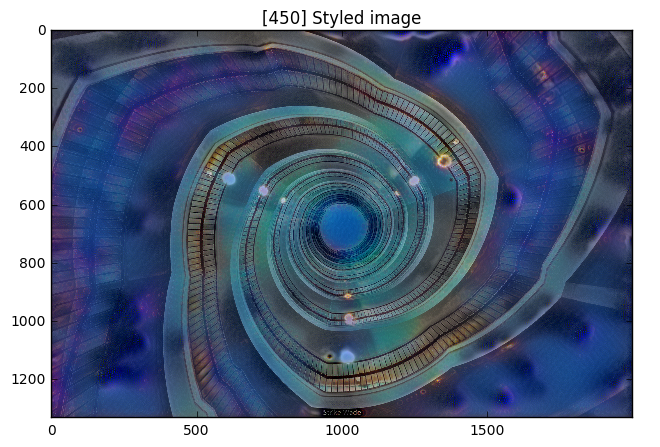

[499/500]


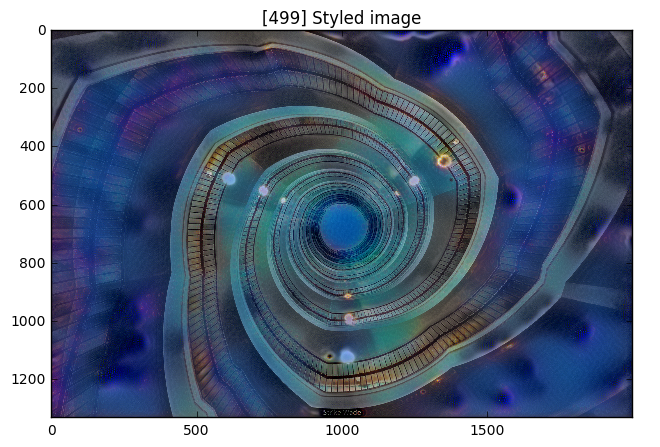

In [6]:
content_weight = 5 
style_weight = 10
tv_weight = 100
learning_rate = 5
epochs = 500

def tensor_size(tensor):
    return reduce(mul, (d.value for d in tensor.get_shape()), 1)

with tf.Graph().as_default(), tf.Session() as sess:
    init = tf.random_normal(content_shape) * 0.256
    image2opt = tf.Variable(init)
    nets, mean_pixel, _ = vgg_net(VGG_PATH, image2opt)
    
    # 1. Content Loss
    content_loss = content_weight * (2*tf.nn.l2_loss(nets[CONTENT_LAYER] - content_features) / content_features.size)
    
    # 2. Style Loss
    style_losses = []
    for style_layer in STYLE_LAYERS:
        layer = nets[style_layer]
        _, height, width, number = layer.get_shape()
        size = height * width * number
        feats = tf.reshape(layer, shape=[-1, number.value])
        gram = tf.matmul(tf.transpose(feats), feats) / size.value
        style_gram = style_features[style_layer]
        style_losses.append(2 * tf.nn.l2_loss(gram-style_gram) / style_gram.size)
    style_loss = style_weight * reduce(tf.add, style_losses)
    
    # 3. Total variation denoising
    tv_y_size = tensor_size(image2opt[:,1:,:,:])
    tv_x_size = tensor_size(image2opt[:,:,1:,:])
    tv_loss = tv_weight * 2 * (
    (tf.nn.l2_loss(image2opt[:,1:,:,:] - image2opt[:,:content_shape[1]-1,:,:]) / tv_y_size) + 
    (tf.nn.l2_loss(image2opt[:,:,1:,:] - image2opt[:,:,:content_shape[2]-1,:]) / tv_x_size))
    
    # Overall loss
    loss = content_loss + style_loss + tv_loss
    
    
    #Optimization setup
    optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(loss)
    sess.run(tf.initialize_all_variables())
    
    for i in range(epochs):
        optimizer.run()
        if i % 50 == 0 or i == epochs-1:
            print('[%d/%d]' % (i, epochs))
            out = image2opt.eval()
            
            #Plot
            styled_image = out[0,:,:,:] + content_mean_pixel
            styled_image = np.clip(styled_image, 0, 255).astype(np.uint8)
            plt.figure(0, figsize=(10,5))
            plt.imshow(styled_image)
            plt.title('[%d] Styled image' % i)
            plt.show()
    out = image2opt.eval()

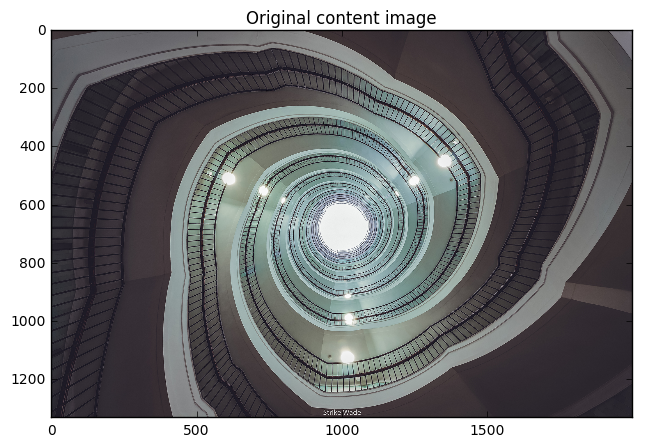

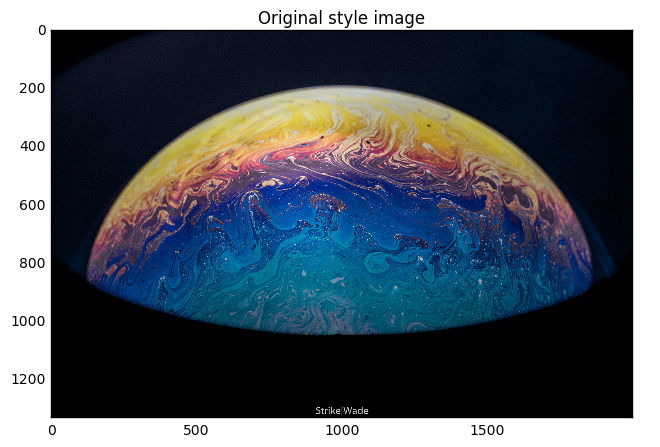

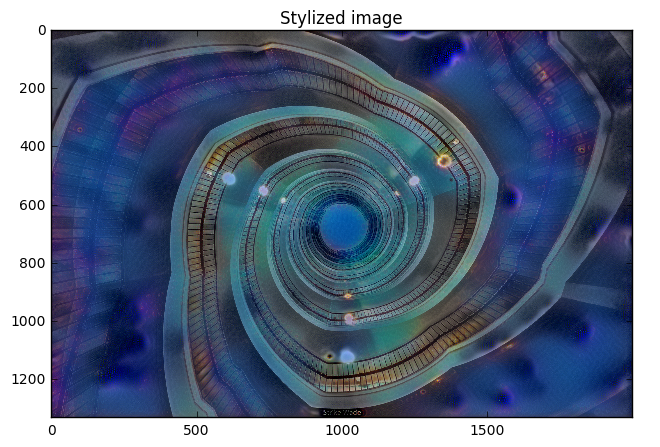

In [7]:
plt.figure(0, figsize=(10, 5))
plt.imshow(raw_content)
plt.title("Original content image")
plt.show()

plt.figure(0, figsize=(10, 5))
plt.imshow(raw_style)
plt.title("Original style image")
plt.show()

stylized_img = out[0, :, :, :] + content_mean_pixel
stylized_img = np.clip(stylized_img, 0, 255).astype('uint8')
plt.figure(1, figsize=(10, 5))
plt.imshow(stylized_img)
plt.title("Stylized image")
plt.show()